In [0]:
!wget https://dl.dropboxusercontent.com/s/h8a8kev0rktf4kq/dataset-sample.tar.gz

--2020-05-15 00:36:00--  https://dl.dropboxusercontent.com/s/h8a8kev0rktf4kq/dataset-sample.tar.gz
Resolving dl.dropboxusercontent.com (dl.dropboxusercontent.com)... 162.125.82.6, 2620:100:6032:6::a27d:5206
Connecting to dl.dropboxusercontent.com (dl.dropboxusercontent.com)|162.125.82.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 418980035 (400M) [application/octet-stream]
Saving to: ‘dataset-sample.tar.gz’

dataset-sample.tar. 100%[===================>] 399.57M  46.7MB/s    in 8.7s    

2020-05-15 00:36:10 (45.8 MB/s) - ‘dataset-sample.tar.gz’ saved [418980035/418980035]



In [0]:
%ls

dataset-sample.tar.gz  sample_data/


In [0]:
!tar -xzvf dataset-sample.tar.gz

dataset-sample/
dataset-sample/elevations/
dataset-sample/elevations/e1d3e6f6ba_B4DE0FB544INSPIRE-elev.tif
dataset-sample/elevations/ec09336a6f_06BA0AF311OPENPIPELINE-elev.tif
dataset-sample/elevations/1d4fbe33f3_F1BE1D4184INSPIRE-elev.tif
dataset-sample/images/
dataset-sample/images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
dataset-sample/images/ec09336a6f_06BA0AF311OPENPIPELINE-ortho.tif
dataset-sample/images/e1d3e6f6ba_B4DE0FB544INSPIRE-ortho.tif
dataset-sample/index.csv
dataset-sample/labels/
dataset-sample/labels/ec09336a6f_06BA0AF311OPENPIPELINE-label.png
dataset-sample/labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
dataset-sample/labels/e1d3e6f6ba_B4DE0FB544INSPIRE-label.png


In [0]:
%ls

dataset-sample/  dataset-sample.tar.gz  sample_data/


In [0]:
%cd dataset-sample/

/content/dataset-sample


In [0]:
!find 

.
./index.csv
./labels
./labels/e1d3e6f6ba_B4DE0FB544INSPIRE-label.png
./labels/ec09336a6f_06BA0AF311OPENPIPELINE-label.png
./labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
./elevations
./elevations/e1d3e6f6ba_B4DE0FB544INSPIRE-elev.tif
./elevations/ec09336a6f_06BA0AF311OPENPIPELINE-elev.tif
./elevations/1d4fbe33f3_F1BE1D4184INSPIRE-elev.tif
./images
./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
./images/ec09336a6f_06BA0AF311OPENPIPELINE-ortho.tif
./images/e1d3e6f6ba_B4DE0FB544INSPIRE-ortho.tif


In [0]:
import pandas as pd
imageInfo = pd.read_csv('index.csv', sep=' ') # we can set the space ' ' as the seperation

In [0]:
imageInfo.shape

(3, 12)

In [0]:

print(imageInfo)


  status                               name  ...  percentage_car  percentage_ignore
0   GOOD       1d4fbe33f3_F1BE1D4184INSPIRE  ...            0.09              18.08
1   GOOD       e1d3e6f6ba_B4DE0FB544INSPIRE  ...            0.12              46.47
2   GOOD  ec09336a6f_06BA0AF311OPENPIPELINE  ...            0.17              31.71

[3 rows x 12 columns]


In [0]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
pd.options.display.width= 1000

print(imageInfo)

  status                               name  rows  cols  visible_classes  percentage_building  percentage_clutter  percentage_vegetation  percentage_water  percentage_ground  percentage_car  percentage_ignore
0   GOOD       1d4fbe33f3_F1BE1D4184INSPIRE  5542  2962                7                21.52                0.41                  15.42              1.63              42.85            0.09              18.08
1   GOOD       e1d3e6f6ba_B4DE0FB544INSPIRE  8408  5924                7                 3.43                1.10                   4.44              1.51              42.94            0.12              46.47
2   GOOD  ec09336a6f_06BA0AF311OPENPIPELINE  4968  7262                6                 2.93                1.29                  22.26              0.00              41.65            0.17              31.71


In [0]:

print(imageInfo.T)

                                                  0                             1                                  2
status                                         GOOD                          GOOD                               GOOD
name                   1d4fbe33f3_F1BE1D4184INSPIRE  e1d3e6f6ba_B4DE0FB544INSPIRE  ec09336a6f_06BA0AF311OPENPIPELINE
rows                                           5542                          8408                               4968
cols                                           2962                          5924                               7262
visible_classes                                   7                             7                                  6
percentage_building                           21.52                          3.43                               2.93
percentage_clutter                             0.41                           1.1                               1.29
percentage_vegetation                         15.42             

In [0]:
imageInfo['path_image'] = './images/'+imageInfo['name']+'-ortho.tif' #we reference the column 'name' and use it to build the path string
imageInfo['path_elevation'] = './elevations/'+imageInfo['name']+'-elev.tif'
imageInfo['path_label'] = './labels/'+imageInfo['name']+'-label.png'

print(imageInfo.T)

                                                                       0                                                  1                                                  2
status                                                              GOOD                                               GOOD                                               GOOD
name                                        1d4fbe33f3_F1BE1D4184INSPIRE                       e1d3e6f6ba_B4DE0FB544INSPIRE                  ec09336a6f_06BA0AF311OPENPIPELINE
rows                                                                5542                                               8408                                               4968
cols                                                                2962                                               5924                                               7262
visible_classes                                                        7                                                  7  

In [0]:
imageInfo0 = imageInfo.iloc[0]
print(imageInfo0['path_image'])
print(imageInfo.iloc[0].path_image)

print(imageInfo0['path_label'])
print(imageInfo.iloc[0].path_label)

./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
./labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
./labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png


In [0]:
for index, row in imageInfo.iterrows():
  print(index, row[['name','visible_classes']])

0 name               1d4fbe33f3_F1BE1D4184INSPIRE
visible_classes                               7
Name: 0, dtype: object
1 name               e1d3e6f6ba_B4DE0FB544INSPIRE
visible_classes                               7
Name: 1, dtype: object
2 name               ec09336a6f_06BA0AF311OPENPIPELINE
visible_classes                                    6
Name: 2, dtype: object


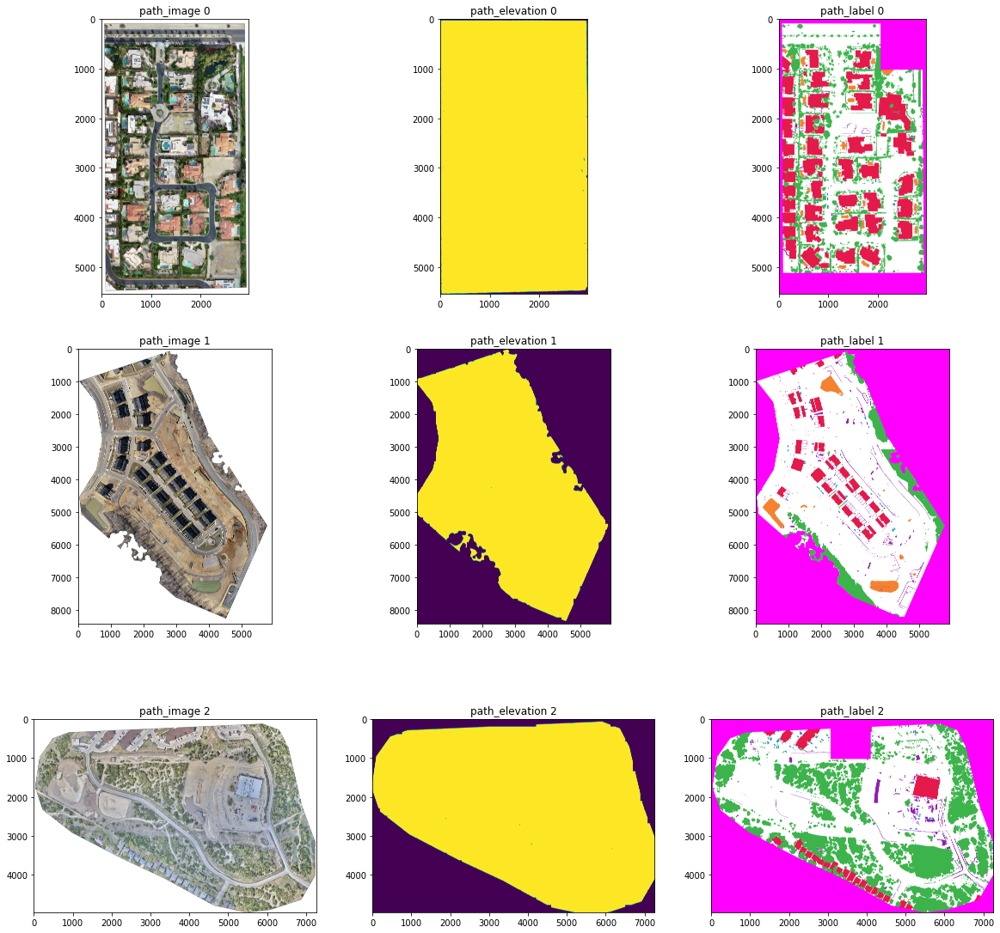

In [0]:
import imageio
from matplotlib import pyplot as plt

import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = [20, 20]

image_types = ['path_image','path_elevation','path_label']
image_type_count = len(image_types)
image_set_count = imageInfo.shape[0]

fig, axs = plt.subplots(image_set_count, image_type_count)
for index, row in imageInfo.iterrows():
  figure_column = 0
  for image_type in image_types:
    axs[index,figure_column].imshow(imageio.imread(row[image_type])) #load the entire image into the axis
    axs[index,figure_column].set_title(image_type+' '+str(index)) #set the title of the axis
    figure_column += 1

Text(0.5, 1.0, 'the blue channel alone')

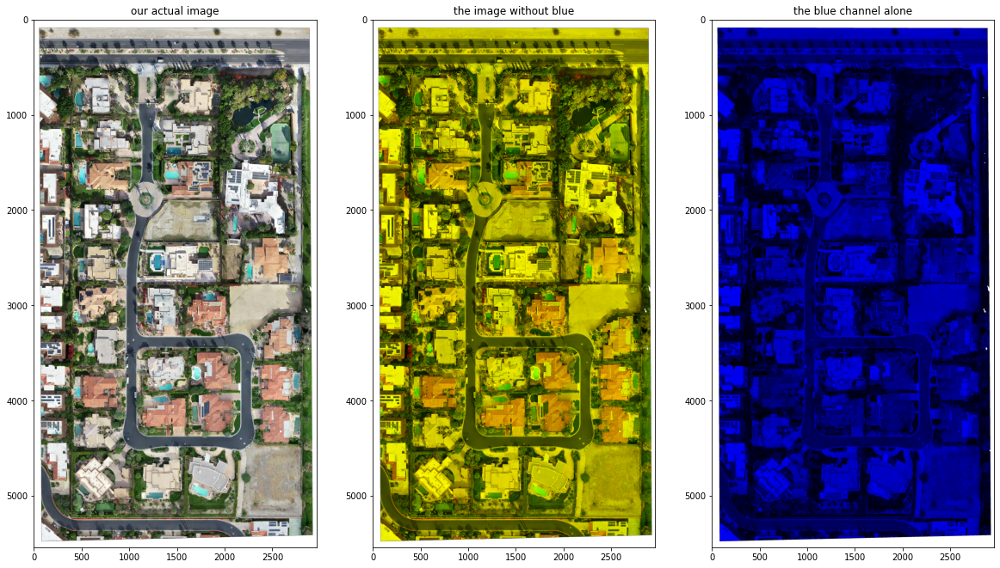

In [0]:
imageRGB = imageio.imread(imageInfo.iloc[0].path_image)
imageRG = imageRGB.copy()
imageRG[:,:,2] = 0 #setting blue to 0 to simulate no blue
imageB = imageRGB.copy()
imageB[:,:,0:2] = 0 #setting red and green to 0 to look at just blue

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGB);axs[0].set_title('our actual image')
axs[1].imshow(imageRG);axs[1].set_title('the image without blue')
axs[2].imshow(imageB);axs[2].set_title('the blue channel alone')

In [0]:
imageRGB = imageio.imread(imageInfo.iloc[0].path_image)
print(imageRGB.shape)
imageRGB_flat = imageRGB.reshape(-1, imageRGB.shape[-1])
print(imageRGB_flat.shape)

(5542, 2962, 4)
(16415404, 4)


In [0]:
imageRG_flat = imageRGB_flat[:,0:2]
imageB_flat = imageRGB_flat[:,2]

In [0]:
imageRG_flat_subsample = imageRG_flat[::100]
imageB_flat_subsample = imageB_flat[::100]

In [0]:
print(imageRG_flat_subsample.shape)
print(imageB_flat_subsample.shape)

(164155, 2)
(164155,)


In [0]:

from sklearn.ensemble import GradientBoostingRegressor
blueModel = GradientBoostingRegressor(n_estimators=100, learning_rate=1,
                                      max_depth=1, random_state=0, loss='huber', verbose=1).fit(imageRG_flat_subsample, imageB_flat_subsample)

      Iter       Train Loss   Remaining Time 
         1         783.2377            6.04s
         2         555.6822            5.99s
         3         474.3631            6.00s
         4         386.4598            6.03s
         5         332.1460            5.98s
         6         309.2735            5.97s
         7         281.7053            5.90s
         8         266.1851            5.89s
         9         256.6886            5.84s
        10         245.0302            5.77s
        20         204.6582            5.22s
        30         186.5296            4.61s
        40         178.6180            3.96s
        50         171.8837            3.32s
        60         166.9794            2.67s
        70         163.8827            2.01s
        80         161.3088            1.34s
        90         159.4628            0.67s
       100         158.2026            0.00s


In [0]:

imageB_flat_model = blueModel.predict(imageRG_flat)

inshape = imageRGB.shape
imageB_model = imageB_flat_model.reshape(inshape[0:2])

Text(0.5, 1.0, 'the difference')

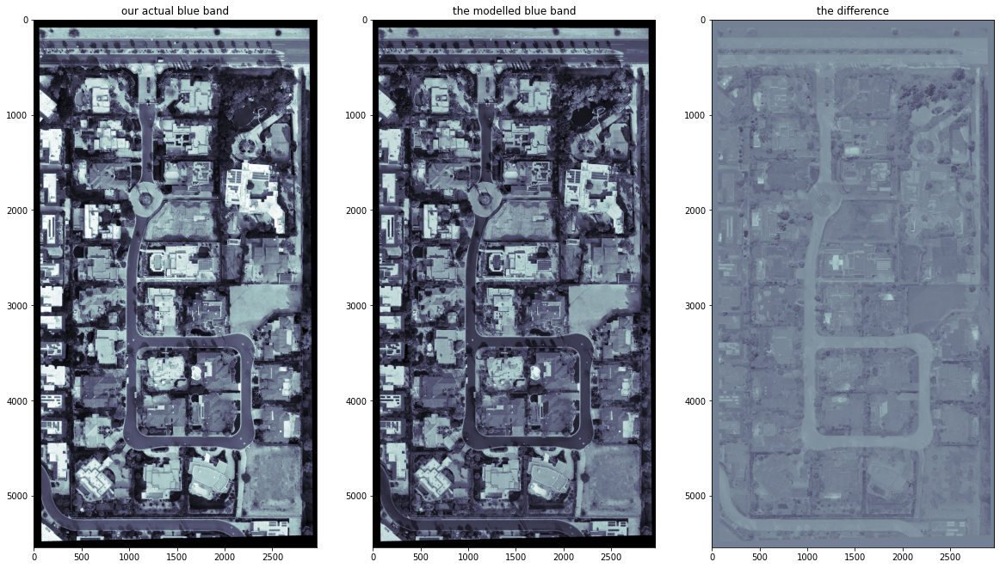

In [0]:

imageB_band = imageB[:,:,2]

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageB_band, cmap='bone');axs[0].set_title('our actual blue band')
axs[1].imshow(imageB_model, cmap='bone');axs[1].set_title('the modelled blue band')
axs[2].imshow(imageB_band-imageB_model, cmap='bone');axs[2].set_title('the difference')

Text(0.5, 1.0, 'blue as simply average of red and green')

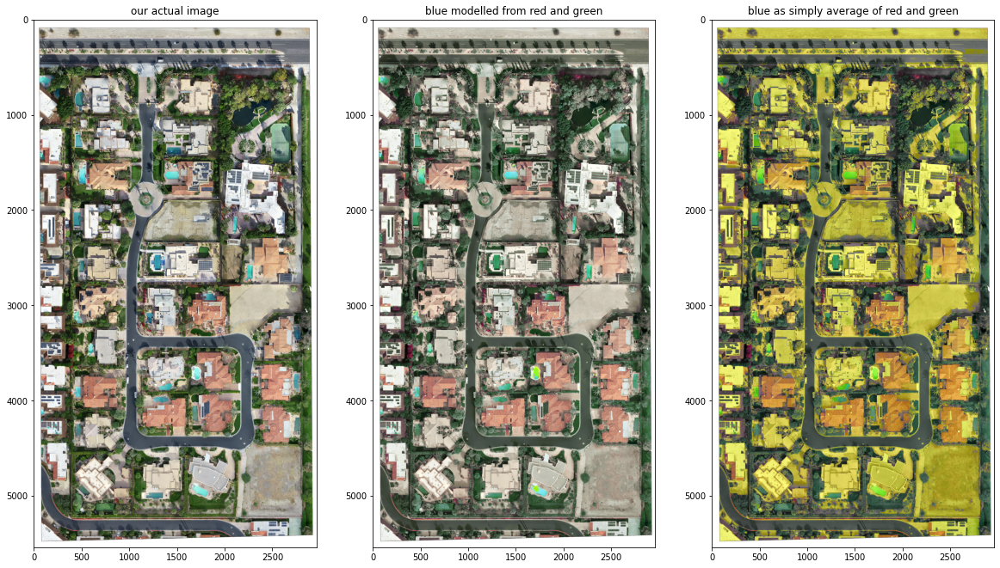

In [0]:
imageRGB_model = imageRGB.copy()
imageRGB_model[:,:,2] = imageB_model

imageRGB_naive = imageRGB.copy()
#lets try... blue as the average of red and green...
imageRGB_naive[:,:,2] = (imageRGB[:,:,1] + imageRGB[:,:,0])//2

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGB);axs[0].set_title('our actual image')
axs[1].imshow(imageRGB_model);axs[1].set_title('blue modelled from red and green')
axs[2].imshow(imageRGB_naive);axs[2].set_title('blue as simply average of red and green')

In [0]:
def applyBlueModel(inRGB, blueModel):

  inRGB_flat = inRGB.reshape(-1, inRGB.shape[-1])

  inRG_flat = inRGB_flat[:,0:2]
  # inB_flat = inGB_flat[:,2] 

  outB_flat_model = blueModel.predict(inRG_flat)

  outB_model = outB_flat_model.reshape(inRGB.shape[0:2])

  outRGB = inRGB.copy()
  outRGB[:,:,2] = outB_model

  return outRGB

Text(0.5, 1.0, 'modelled 2')

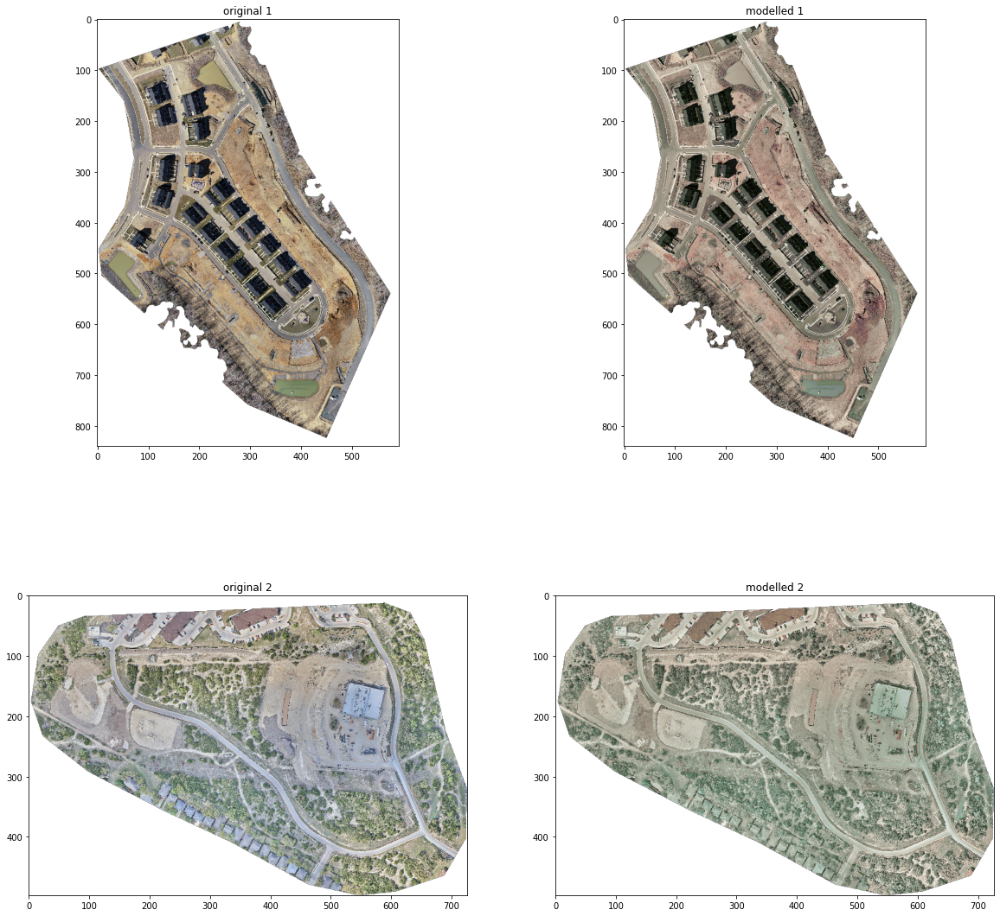

In [0]:
imageRGB_2 = imageio.imread(imageInfo.iloc[2].path_image)[::10,::10]
imageRGB_2_model = applyBlueModel(imageRGB_2, blueModel)

imageRGB_1 = imageio.imread(imageInfo.iloc[1].path_image)[::10,::10]
imageRGB_1_model = applyBlueModel(imageRGB_1, blueModel)

fig, axs = plt.subplots(2, 2)
axs[0,0].imshow(imageRGB_1);axs[0,0].set_title('original 1')
axs[0,1].imshow(imageRGB_1_model);axs[0,1].set_title('modelled 1')
axs[1,0].imshow(imageRGB_2);axs[1,0].set_title('original 2')
axs[1,1].imshow(imageRGB_2_model);axs[1,1].set_title('modelled 2')

In [0]:
import numpy as np # lets grab numpy as well

reduction = 10
imagelabel = imageio.imread(imageInfo.iloc[0].path_label)[::reduction,::reduction,:]
imagelabel.shape

(555, 297, 3)

In [0]:
lut_rgb = {(255, 0, 255) : 0,
        (230, 25, 75) : 1,
        (145, 30, 180) : 2,
        (60, 180, 75) : 3,
        (245, 130,48) : 4,
        (255, 255, 255) : 5,
        (0,130,200) : 6}

def rgb2label(rgb_array):
  def indexLUT(rgb_array):
    return lut_rgb[tuple(rgb_array)]
  label_array = np.apply_along_axis(indexLUT, 2, rgb_array)
  return label_array

In [0]:
imagelabel_value = rgb2label(imagelabel)
imagelabel_value.shape

(555, 297)

In [0]:
lut_label =np.array([[255, 0, 255],
      [230, 25, 75],
      [145, 30, 180],
      [60, 180, 75],
      [245, 130,48],
      [255, 255, 255],
      [0,130,200]])

def label2rgb(label_array):
  rgb_array = np.zeros(label_array.shape + (3,), dtype=np.uint8)
  rgb_array = np.take(lut_label, label_array, axis=0, out=rgb_array)

  return rgb_array

In [0]:
class_names = ['IGNORE', 'BUILDING', 'CLUTTER', 'VEGETATION', 'WATER', 'GROUND', 'CAR']

In [0]:
imagelabel_test = label2rgb(imagelabel_value)
imagelabel_test.shape

(555, 297, 3)

Text(0.5, 1.0, 'reconstructed RGB label test')

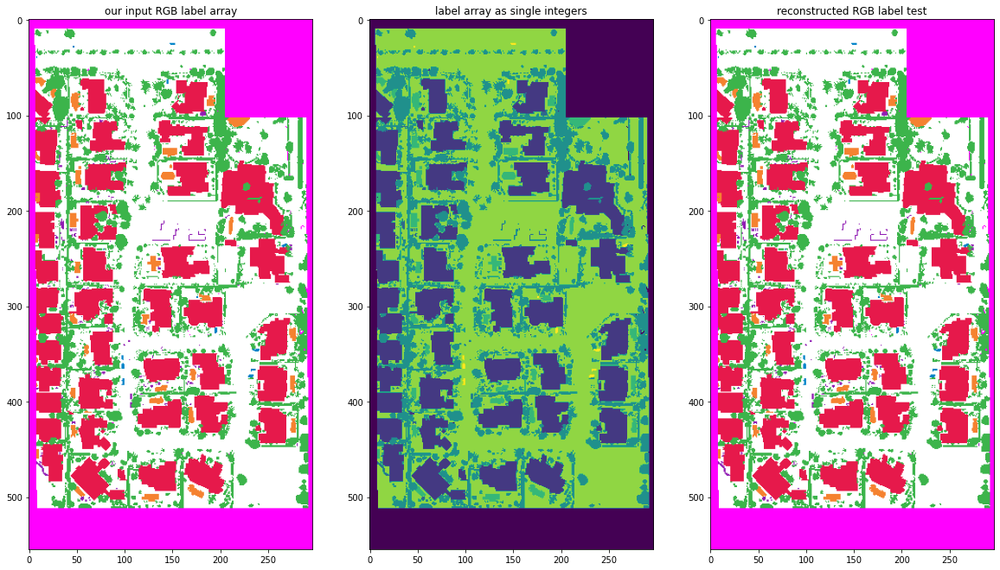

In [0]:
fig, axs = plt.subplots(1, 3)
axs[0].imshow(imagelabel);axs[0].set_title('our input RGB label array')
axs[1].imshow(imagelabel_value);axs[1].set_title('label array as single integers')
axs[2].imshow(imagelabel_test);axs[2].set_title('reconstructed RGB label test')

In [0]:
imageRGBA = imageio.imread(imageInfo.iloc[0].path_image)[::reduction,::reduction,:]
imageRGB = imageRGBA[:,:,0:3]
imageRGB_flat = imageRGB.reshape(-1, imageRGB.shape[-1])

imagelabel_value_flat = imagelabel_value.flatten()

imageRGB_flat_subsample = imageRGB_flat[::100]
imagelabel_value_flat_subsample = imagelabel_value_flat[::100]

print(imageRGB_flat.shape)
print(imagelabel_value_flat.shape)

(164835, 3)
(164835,)


In [0]:

def ourClassifer(examples,targets, dropclass = 0):
  dropMask = targets==dropclass
  targets = targets[~dropMask]
  examples = examples[~dropMask,:]

  from sklearn.ensemble import GradientBoostingClassifier
  classModel = GradientBoostingClassifier(n_estimators=1000, learning_rate=0.1,
                                  max_depth=1, random_state=0,verbose=1).fit(examples, targets)
  return classModel

In [0]:

clf = ourClassifer(imageRGB_flat_subsample, imagelabel_value_flat_subsample)

      Iter       Train Loss   Remaining Time 
         1        1476.2301            9.29s
         2        1410.7299            8.26s
         3        1377.0139            7.98s
         4        1349.4638            8.14s
         5        1328.0487            7.93s
         6        1309.2923            7.81s
         7        1292.8467            7.68s
         8        1279.8320            7.87s
         9        1267.8242            7.77s
        10        1257.8234            7.68s
        20        1195.8254            7.15s
        30        1165.1673            7.20s
        40        1142.8452            7.08s
        50        1123.9527            6.93s
        60        1107.7336            6.84s
        70        1093.9957            6.73s
        80        1080.9665            6.64s
        90        1069.8470            6.56s
       100        1059.2294            6.48s
       200         986.2218            5.72s
       300         941.6997            4.95s
       40

Text(0.5, 1.0, 'modeled labels: GBDT Regression (RGB)')

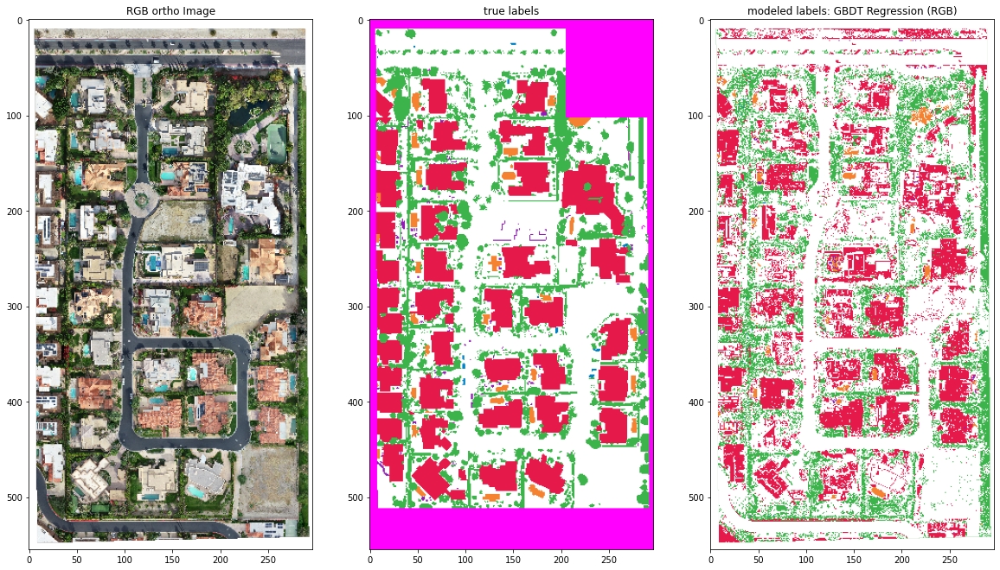

In [0]:
imagelabel_value_flat_model = clf.predict(imageRGB_flat)
plt.rcParams['figure.figsize'] = [20, 20]
inshape = imageRGB.shape
imagelabel_value_model = imagelabel_value_flat_model.reshape(inshape[0:2])
imagelabel_model = label2rgb(imagelabel_value_model)

# we can use the RGBA alpha channel to set the nan area to white in the results
imagelabel_model = np.dstack([imagelabel_model,imageRGBA[:,:,3]]) 

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB ortho Image')
axs[1].imshow(imagelabel);axs[1].set_title('true labels')
axs[2].imshow(imagelabel_model);axs[2].set_title('modeled labels: GBDT Regression (RGB)')

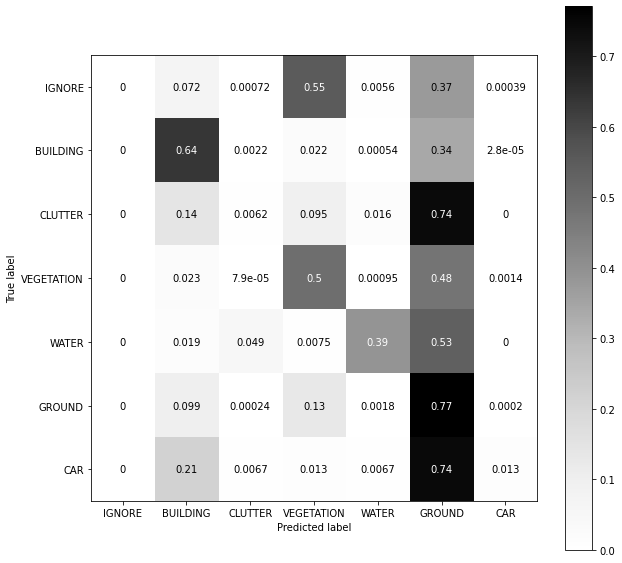

In [0]:
from sklearn.metrics import plot_confusion_matrix
plt.rcParams['figure.figsize'] = [10, 10] #lets reduce the plot size a little 
plot_confusion_matrix(clf, imageRGB_flat, imagelabel_value_flat, display_labels=class_names,cmap='Greys',
                                 normalize='true')
plt.rcParams['figure.figsize'] = [20, 20] #bump that plot size back up

Text(0.5, 1.0, 'class after subsample')

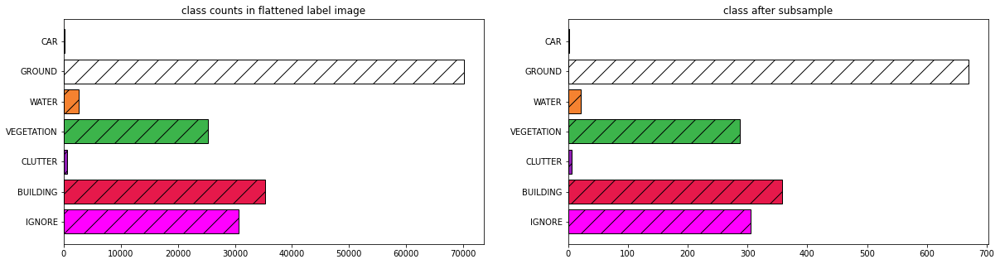

In [0]:
fig, ax = plt.subplots(1,2)
fig.set_figheight(5)

labels, counts = np.unique(imagelabel_value_flat,return_counts=True)
ax[0].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[0].set_yticks(np.arange(len(class_names)))
ax[0].set_yticklabels(class_names)
ax[0].set_title('class counts in flattened label image')

labels, counts = np.unique(imagelabel_value_flat_subsample,return_counts=True)
ax[1].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[1].set_yticks(np.arange(len(class_names)))
ax[1].set_yticklabels(class_names)
ax[1].set_title('class after subsample')

In [0]:
listOfSamples_RGB = []
listOfSamples_label = []
reduction = 50 
count = 750

for label in labels: # bit sloppy but 'labels' is avilable from our plots above
  labelSubset = imagelabel_value_flat[::reduction][imagelabel_value_flat[::reduction]==label][:count]
  listOfSamples_label.append(labelSubset)
  featureSubset = imageRGB_flat[::reduction][imagelabel_value_flat[::reduction]==label,:][:count,:]
  listOfSamples_RGB.append(featureSubset)

imageRGB_flat_subsample2 = np.vstack(listOfSamples_RGB)
imagelabel_value_flat_subsample2 = np.hstack(listOfSamples_label)

Text(0.5, 1.0, 'class counts after new subsample')

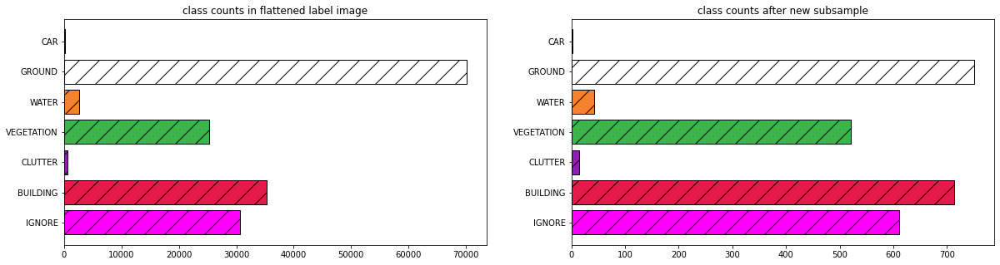

In [0]:
fig, ax = plt.subplots(1,2)
fig.set_figheight(5)

labels, counts = np.unique(imagelabel_value_flat,return_counts=True)
ax[0].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[0].set_yticks(np.arange(len(class_names)))
ax[0].set_yticklabels(class_names)
ax[0].set_title('class counts in flattened label image')

labels, counts = np.unique(imagelabel_value_flat_subsample2,return_counts=True)
ax[1].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[1].set_yticks(np.arange(len(class_names)))
ax[1].set_yticklabels(class_names)
ax[1].set_title('class counts after new subsample')

In [0]:
clf2 = ourClassifer(imageRGB_flat_subsample2, imagelabel_value_flat_subsample2)

      Iter       Train Loss   Remaining Time 
         1        2394.8787           12.45s
         2        2299.8111           10.72s
         3        2240.4057           10.70s
         4        2191.6053           10.42s
         5        2153.7530           10.13s
         6        2117.4072            9.97s
         7        2089.0559            9.84s
         8        2064.0481            9.73s
         9        2043.7753            9.65s
        10        2024.9331            9.61s
        20        1921.0716            9.25s
        30        1872.2242            9.14s
        40        1838.1664            8.95s
        50        1810.8165            8.80s
        60        1786.9975            8.85s
        70        1766.0941            8.73s
        80        1747.2418            8.60s
        90        1729.5240            8.53s
       100        1713.7988            8.40s
       200        1602.9184            7.40s
       300        1540.5966            6.45s
       40

Text(0.5, 1.0, 'modeled labels: GBDT Regression (RGB)- select subsample')

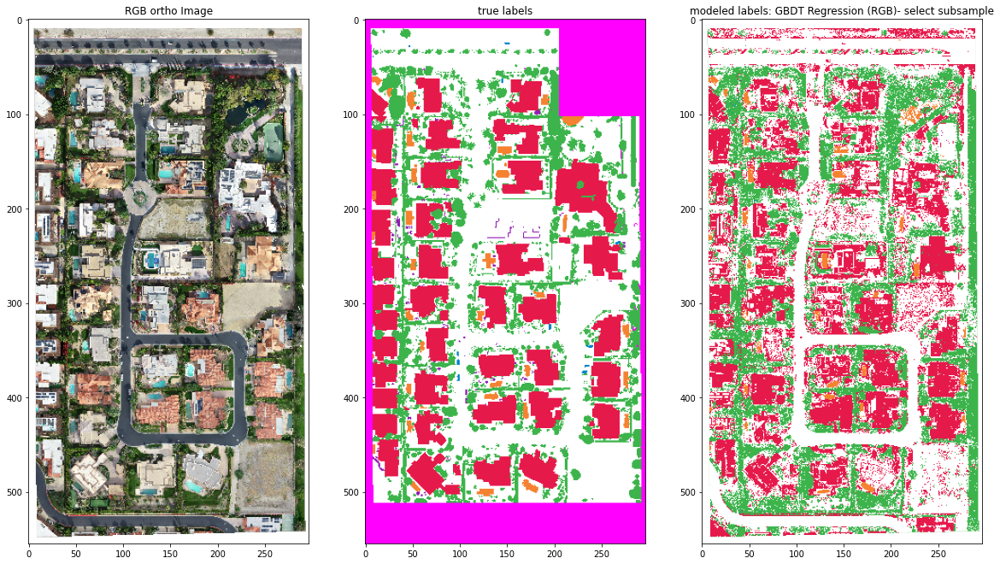

In [0]:
imagelabel_value_flat_model = clf2.predict(imageRGB_flat)

inshape = imageRGB.shape
imagelabel_value_model = imagelabel_value_flat_model.reshape(inshape[0:2])
imagelabel_model = label2rgb(imagelabel_value_model)
imagelabel_model = np.dstack([imagelabel_model, imageRGBA[:,:,3]]) #again, for the alpha channel

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB ortho Image')
axs[1].imshow(imagelabel);axs[1].set_title('true labels')
axs[2].imshow(imagelabel_model);axs[2].set_title('modeled labels: GBDT Regression (RGB)- select subsample')

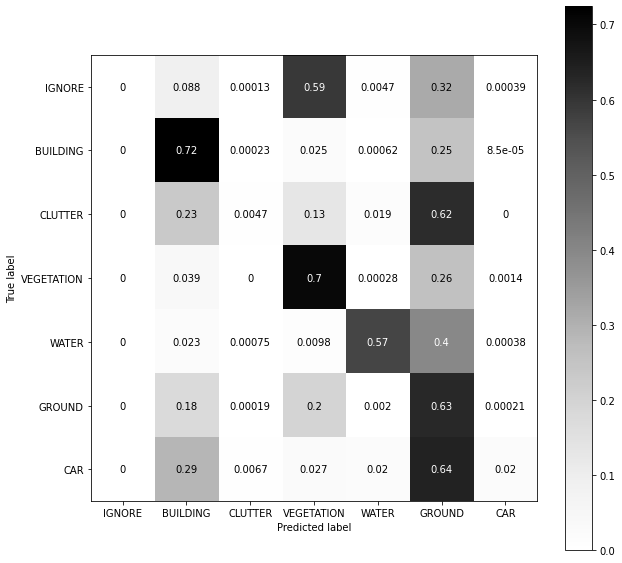

In [0]:
from sklearn.metrics import plot_confusion_matrix
plt.rcParams['figure.figsize'] = [10, 10] #lets reduce the plot size a little 
plot_confusion_matrix(clf2, imageRGB_flat, imagelabel_value_flat, display_labels=class_names,cmap='Greys',
                                 normalize='true')
plt.rcParams['figure.figsize'] = [20, 20] #bump that plot size back up


In [0]:

reduction=10
elevation32 = imageio.imread(imageInfo.iloc[0].path_elevation)[::reduction,::reduction]
print(elevation32[0,0])

-32767.0


In [0]:
elevation32_nan = elevation32.copy()
elevation32_nan[elevation32_nan==-32767.0] = np.nan

Text(0.5, 1.0, 'reconstructed RGB label test')

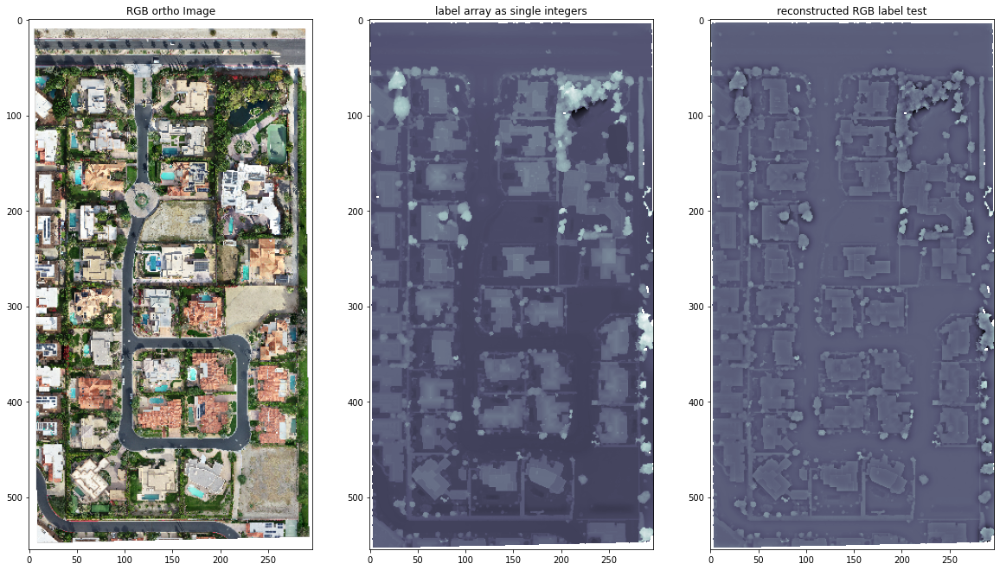

In [0]:
from astropy.convolution import convolve
from astropy.convolution import Gaussian2DKernel
kernel = Gaussian2DKernel(x_stddev=4)
elevation32_tpi = convolve(elevation32_nan, kernel)
elevation32_tpi -= elevation32_nan
elevation32_tpi = -elevation32_tpi # lets 'flip' the values, for plotting

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB ortho Image')
axs[1].imshow(elevation32_nan, cmap='bone');axs[1].set_title('label array as single integers')
axs[2].imshow(elevation32_tpi, cmap='bone');axs[2].set_title('reconstructed RGB label test')

In [0]:

def float2int(array32):
  array32_norm = array32.copy()
  array32_norm -= np.nanmin(array32_norm)
  array32_norm /= np.nanmax(array32_norm)
  array8 = array32_norm*255
  return array8.astype(np.uint8)

In [0]:

elevation8 = float2int(elevation32_nan)
elevation8_tpi = float2int(elevation32_tpi)

imageRGBE = np.dstack([imageRGB, elevation8,elevation8_tpi])
imageRGBE_flat = imageRGBE.reshape(-1, imageRGBE.shape[-1])

imagelabel_value_flat = imagelabel_value.flatten()

imageRGBE_flat_subsample = imageRGBE_flat[::100]
imagelabel_value_flat_subsample = imagelabel_value_flat[::100]

print(imageRGBE_flat.shape)
print(imagelabel_value_flat.shape)

(164835, 5)
(164835,)


In [0]:

clf3 = ourClassifer(imageRGBE_flat_subsample,imagelabel_value_flat_subsample)

      Iter       Train Loss   Remaining Time 
         1        1397.8793           11.69s
         2        1272.1266            9.82s
         3        1194.3514            9.22s
         4        1129.9567            8.93s
         5        1079.1959            8.85s
         6        1034.6406            8.83s
         7         994.5489            8.87s
         8         959.0131            8.75s
         9         928.7862            8.68s
        10         902.2733            8.60s
        20         748.9891            8.03s
        30         683.6565            7.90s
        40         648.4176            7.78s
        50         623.1370            7.64s
        60         603.8349            7.65s
        70         588.9171            7.52s
        80         577.2746            7.39s
        90         566.3230            7.34s
       100         555.9101            7.23s
       200         492.7190            6.43s
       300         453.4965            5.55s
       40

Text(0.5, 1.0, 'modeled labels: GBDT Regression (RGB, Elev. & TPI)')

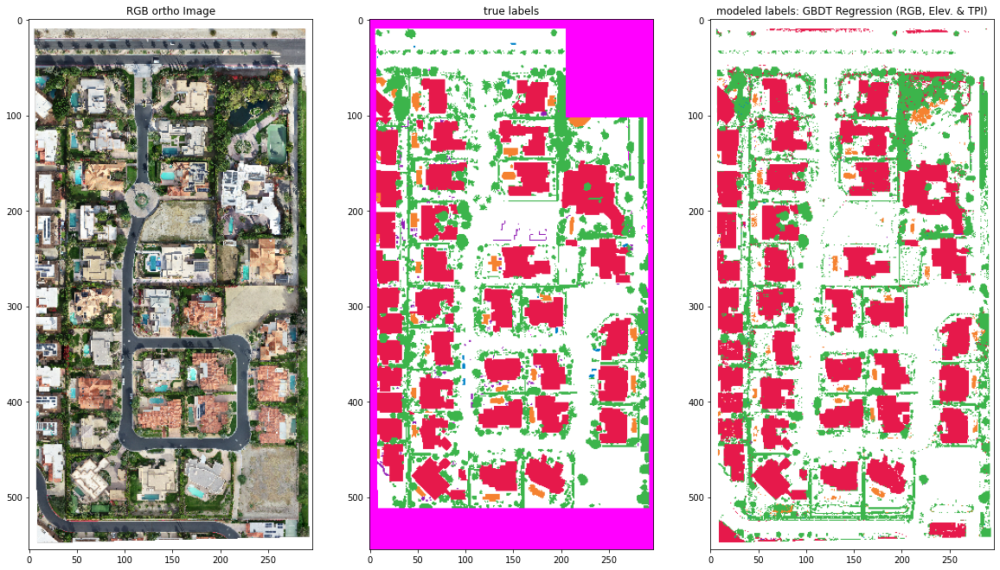

In [0]:

imagelabel_value_flat_model_elevation = clf3.predict(imageRGBE_flat)

inshape = imageRGB.shape
imagelabel_value_model_elevation = imagelabel_value_flat_model_elevation.reshape(inshape[0:2])
imagelabel_model_elevation = label2rgb(imagelabel_value_model_elevation)
imagelabel_model_elevation = np.dstack([imagelabel_model_elevation,imageRGBA[:,:,3]])

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB ortho Image')
axs[1].imshow(imagelabel);axs[1].set_title('true labels')
axs[2].imshow(imagelabel_model_elevation);axs[2].set_title('modeled labels: GBDT Regression (RGB, Elev. & TPI)')

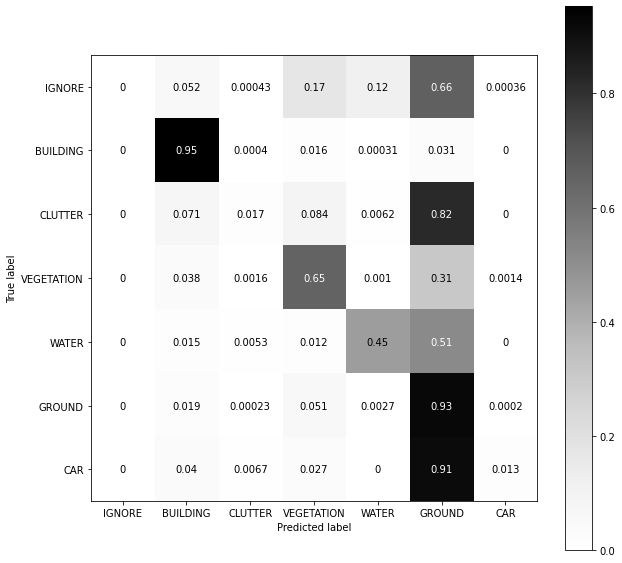

In [0]:

from sklearn.metrics import plot_confusion_matrix
plt.rcParams['figure.figsize'] = [10, 10] #lets reduce the plot size a little 
plot_confusion_matrix(clf3, imageRGBE_flat, imagelabel_value_flat, display_labels=class_names,cmap='Greys',
                                 normalize='true')
plt.rcParams['figure.figsize'] = [20, 20] #bump that plot size back up

Text(0.5, 1.0, 'modeled labels: GBDT Regression (RGB, Elev. & TPI) - filtered')

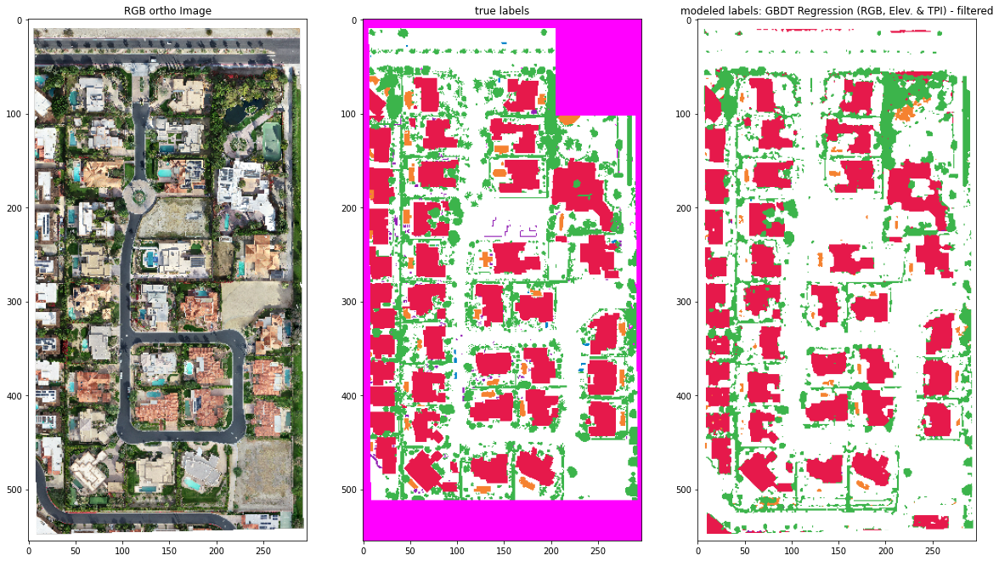

In [0]:

plt.rcParams['figure.figsize'] = [20, 20]

from scipy import ndimage
imagelabel_value_model_elevation_median = ndimage.median_filter(imagelabel_value_model_elevation, size=2)
imagelabel_model_elevation_median = label2rgb(imagelabel_value_model_elevation_median)
imagelabel_model_elevation_median = np.dstack([imagelabel_model_elevation_median,imageRGBA[:,:,3]])

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB ortho Image')
axs[1].imshow(imagelabel);axs[1].set_title('true labels')
axs[2].imshow(imagelabel_model_elevation_median);axs[2].set_title('modeled labels: GBDT Regression (RGB, Elev. & TPI) - filtered')